In [1]:
import pycisTopic
import glob
import os
import pybiomart as pbm
import pandas as pd
import pickle
from pycisTopic.qc import *
from IPython.display import Image, display
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import multiprocess as mp  # for kde multithreading calculation
from multiprocess import Pool

%matplotlib inline
%load_ext lab_black

# Download annotation

In [2]:
!pwd

/lustre1/project/stg_00090/scatac_benchmark/public_3_cistopic_qc


In [3]:
wdir = "/lustre1/project/stg_00090/scatac_benchmark/public_3_cistopic_qc"
os.chdir(wdir)

In [4]:
genome = "mm10"

pbm_genome_name_dict = {
    "hg38": "hsapiens_gene_ensembl",
    "hg37": "hsapiens_gene_ensembl",
    "mm10": "mmusculus_gene_ensembl",
    "dm6": "dmelanogaster_gene_ensembl",
}

pbm_host_dict = {
    "hg38": "http://www.ensembl.org",
    "hg37": "http://grch37.ensembl.org/",
    "mm10": "http://nov2020.archive.ensembl.org/",
    "dm6": "http://www.ensembl.org",
}

if os.path.exists(f"annotation.tsv"):
    print(f"Loading cached genome annotation...")
    annotation = pd.read_csv("annotation.tsv", sep="\t", header=0, index_col=0)
else:
    dataset = pbm.Dataset(name=pbm_genome_name_dict[genome], host=pbm_host_dict[genome])

    annotation = dataset.query(
        attributes=[
            "chromosome_name",
            "transcription_start_site",
            "strand",
            "external_gene_name",
            "transcript_biotype",
        ]
    )
    filter = annotation["Chromosome/scaffold name"].str.contains("CHR|GL|JH|MT")
    annotation = annotation[~filter]
    annotation["Chromosome/scaffold name"] = annotation[
        "Chromosome/scaffold name"
    ].str.replace(r"(\b\S)", r"chr\1")
    annotation.columns = ["Chromosome", "Start", "Strand", "Gene", "Transcript_type"]
    annotation = annotation[annotation.Transcript_type == "protein_coding"]
    annotation.to_csv("annotation.tsv", sep="\t")

Loading cached genome annotation...


In [5]:
fragments_list = sorted(
    glob.glob("../1_data_repository/publicdata_full_fragments_vsn/*.tsv.gz")
)
fragments_dict = {}
for fragments_file in fragments_list:
    sample = fragments_file.split("/")[-1].split("_fragments.tsv.gz")[0]
    fragments_dict[sample] = fragments_file
fragments_dict

{'BIO_ddseq_m1c1.FULL.fragments.tsv.gz': '../1_data_repository/publicdata_full_fragments_vsn/BIO_ddseq_m1c1.FULL.fragments.tsv.gz',
 'BIO_ddseq_m1c2.FULL.fragments.tsv.gz': '../1_data_repository/publicdata_full_fragments_vsn/BIO_ddseq_m1c2.FULL.fragments.tsv.gz',
 'BIO_ddseq_m1c3.FULL.fragments.tsv.gz': '../1_data_repository/publicdata_full_fragments_vsn/BIO_ddseq_m1c3.FULL.fragments.tsv.gz',
 'BIO_ddseq_m1c4.FULL.fragments.tsv.gz': '../1_data_repository/publicdata_full_fragments_vsn/BIO_ddseq_m1c4.FULL.fragments.tsv.gz',
 'BIO_ddseq_m1c5.FULL.fragments.tsv.gz': '../1_data_repository/publicdata_full_fragments_vsn/BIO_ddseq_m1c5.FULL.fragments.tsv.gz',
 'BIO_ddseq_m1c6.FULL.fragments.tsv.gz': '../1_data_repository/publicdata_full_fragments_vsn/BIO_ddseq_m1c6.FULL.fragments.tsv.gz',
 'BIO_ddseq_m1c7.FULL.fragments.tsv.gz': '../1_data_repository/publicdata_full_fragments_vsn/BIO_ddseq_m1c7.FULL.fragments.tsv.gz',
 'BIO_ddseq_m1c8.FULL.fragments.tsv.gz': '../1_data_repository/publicdata_fu

The regions we will count in. Here, I count everything in the human ENCODE SCREEN regions. You can also add a sample-specific region set, e.g. sample-specific peaks called on the sample's bams.

In [6]:
region = "../0_resources/regions/V2.mm10-rDHS-Unfiltered.blacklisted.bed"

Now, make a sub dictionary of all samples within the fragments dict that have not been run yet (good for resuming a stopped cistopic run):

In [7]:
cistopic_qc_out = os.path.join(wdir, "cistopic_qc_out")
if not os.path.exists(cistopic_qc_out):
    os.makedirs(cistopic_qc_out)

In [8]:
fragments_sub_dict = {}
regions_sub_dict = {}
for sample in fragments_dict:
    metadata_file = os.path.join(cistopic_qc_out, sample + "__metadata_bc.pkl")
    print(f"Checking if {metadata_file} exist...")
    if os.path.exists(metadata_file):
        print("\tMetadata exists! Skipping...")
    else:
        fragments_sub_dict[sample] = fragments_dict[sample]
        print("\tMetadata does not exist, adding to subdict to generate")
        regions_sub_dict = {x: region for x in sorted(fragments_sub_dict.keys())}

Checking if /lustre1/project/stg_00090/scatac_benchmark/public_3_cistopic_qc/cistopic_qc_out/BIO_ddseq_m1c1.FULL.fragments.tsv.gz__metadata_bc.pkl exist...
	Metadata does not exist, adding to subdict to generate
Checking if /lustre1/project/stg_00090/scatac_benchmark/public_3_cistopic_qc/cistopic_qc_out/BIO_ddseq_m1c2.FULL.fragments.tsv.gz__metadata_bc.pkl exist...
	Metadata does not exist, adding to subdict to generate
Checking if /lustre1/project/stg_00090/scatac_benchmark/public_3_cistopic_qc/cistopic_qc_out/BIO_ddseq_m1c3.FULL.fragments.tsv.gz__metadata_bc.pkl exist...
	Metadata does not exist, adding to subdict to generate
Checking if /lustre1/project/stg_00090/scatac_benchmark/public_3_cistopic_qc/cistopic_qc_out/BIO_ddseq_m1c4.FULL.fragments.tsv.gz__metadata_bc.pkl exist...
	Metadata does not exist, adding to subdict to generate
Checking if /lustre1/project/stg_00090/scatac_benchmark/public_3_cistopic_qc/cistopic_qc_out/BIO_ddseq_m1c5.FULL.fragments.tsv.gz__metadata_bc.pkl exist

In [9]:
ray.shutdown()

In [10]:
n_cores = 8
if fragments_sub_dict != {}:
    samples_sub = list(fragments_sub_dict.keys())
    blocks = [samples_sub[i : i + n_cores] for i in range(0, len(samples_sub), n_cores)]
    for samples_torun_in_block in blocks:
        fragments_sub_dict_block = {
            key: fragments_sub_dict[key] for key in samples_torun_in_block
        }
        regions_sub_dict_block = {
            key: regions_sub_dict[key] for key in samples_torun_in_block
        }

        metadata_bc_dict, profile_data_dict = compute_qc_stats(
            fragments_dict=fragments_sub_dict_block,
            tss_annotation=annotation,
            stats=[
                "barcode_rank_plot",
                "duplicate_rate",
                "insert_size_distribution",
                "profile_tss",
                "frip",
            ],
            label_list=None,
            path_to_regions=regions_sub_dict_block,
            n_cpu=n_cores,
            valid_bc=None,
            n_frag=10,
            n_bc=None,
            tss_flank_window=2000,
            tss_window=50,
            tss_minimum_signal_window=100,
            tss_rolling_window=10,
            # min_norm=0.2,
            remove_duplicates=True,
        )

        ray.shutdown()
        print(f"Dumping files in {cistopic_qc_out}...")
        for sample in sorted(metadata_bc_dict.keys()):
            metadata_bc_dict[sample]["sample_id"] = sample
            metadata_bc_dict[sample].index = [
                x + "___" + sample for x in list(metadata_bc_dict[sample].index)
            ]
            with open(
                os.path.join(cistopic_qc_out, f"{sample}__metadata_bc.pkl"), "wb"
            ) as f:
                pickle.dump(metadata_bc_dict[sample], f, protocol=4)

            with open(
                os.path.join(cistopic_qc_out, f"{sample}__profile_data.pkl"), "wb"
            ) as f:
                pickle.dump(profile_data_dict[sample], f, protocol=4)
else:
    print("All samples already processed.")

2022-10-14 12:26:54,257	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


(compute_qc_stats_ray pid=1755170) 2022-10-14 12:26:59,751 cisTopic     INFO     Reading BIO_ddseq_m1c6.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1755177) 2022-10-14 12:26:59,796 cisTopic     INFO     Reading BIO_ddseq_m1c4.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1755174) 2022-10-14 12:26:59,818 cisTopic     INFO     Reading BIO_ddseq_m1c7.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1755173) 2022-10-14 12:26:59,785 cisTopic     INFO     Reading BIO_ddseq_m1c8.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1755176) 2022-10-14 12:26:59,799 cisTopic     INFO     Reading BIO_ddseq_m1c5.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1755171) 2022-10-14 12:26:59,797 cisTopic     INFO     Reading BIO_ddseq_m1c2.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1755175) 2022-10-14 12:26:59,779 cisTopic     INFO     Reading BIO_ddseq_m1c3.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1755172) 2022-10-14 12:26:59,819 cisTopic     INFO     Reading BIO_ddseq_m1c1.FULL.fragments

2022-10-14 12:37:22,671	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


(compute_qc_stats_ray pid=1758231) 2022-10-14 12:37:26,847 cisTopic     INFO     Reading BIO_ddseq_m2c2.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1758228) 2022-10-14 12:37:26,937 cisTopic     INFO     Reading TXG_10xv11_adultmousecortexchromiumx.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1758229) 2022-10-14 12:37:26,938 cisTopic     INFO     Reading TXG_10xmultiome_e18mousebrainfresh.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1758230) 2022-10-14 12:37:26,937 cisTopic     INFO     Reading TXG_10xv1_adultmousefresh.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1758227) 2022-10-14 12:37:26,867 cisTopic     INFO     Reading OHS_s3atac_s3ATAC_Mouse.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1758225) 2022-10-14 12:37:26,858 cisTopic     INFO     Reading BIO_ddseq_m2c1.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1758232) 2022-10-14 12:37:26,954 cisTopic     INFO     Reading BIO_ddseq_m2c3.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1758226) 2022-10-14 12:37:26,9

2022-10-14 12:48:47,146	INFO services.py:1470 -- View the Ray dashboard at http://127.0.0.1:8265


(compute_qc_stats_ray pid=1761387) 2022-10-14 12:48:51,235 cisTopic     INFO     Reading VIB_hydrop_2.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761389) 2022-10-14 12:48:51,236 cisTopic     INFO     Reading TXG_10xv2_adultmousecortexchromiumx.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761386) 2022-10-14 12:48:51,256 cisTopic     INFO     Reading TXG_10xv2_adultmousecortex.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761383) 2022-10-14 12:48:51,234 cisTopic     INFO     Reading VIB_hydrop_3.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761384) 2022-10-14 12:48:51,293 cisTopic     INFO     Reading VIB_hydrop_5.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761388) 2022-10-14 12:48:51,287 cisTopic     INFO     Reading VIB_hydrop_1.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761385) 2022-10-14 12:48:51,333 cisTopic     INFO     Reading VIB_hydrop_4.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761384) 2022-10-14 12:49:46,502 cisTopic     INFO     Computing barc

(compute_qc_stats_ray pid=1761384) /opt/venv/lib/python3.8/site-packages/pandas/core/reshape/reshape.py:134: PerformanceWarning: The following operation may generate 2853229129 cells in the resulting pandas object.
(compute_qc_stats_ray pid=1761384)   warnings.warn(


(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:08,134 cisTopic     INFO     Computing barcode rank plot for TXG_10xv2_adultmousecortex.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:08,134 cisTopic     INFO     Counting fragments


(compute_qc_stats_ray pid=1761387) /opt/venv/lib/python3.8/site-packages/pandas/core/reshape/reshape.py:134: PerformanceWarning: The following operation may generate 2609352175 cells in the resulting pandas object.
(compute_qc_stats_ray pid=1761387)   warnings.warn(


(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:11,272 cisTopic     INFO     Computing barcode rank plot for TXG_10xv2_adultmousecortexchromiumx.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:11,273 cisTopic     INFO     Counting fragments
(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:16,926 cisTopic     INFO     Marking barcodes with more than 10
(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:17,007 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:17,018 cisTopic     INFO     Returning valid barcodes


(compute_qc_stats_ray pid=1761388) /opt/venv/lib/python3.8/site-packages/pandas/core/reshape/reshape.py:134: PerformanceWarning: The following operation may generate 2584345925 cells in the resulting pandas object.
(compute_qc_stats_ray pid=1761388)   warnings.warn(
(compute_qc_stats_ray pid=1761385) /opt/venv/lib/python3.8/site-packages/pandas/core/reshape/reshape.py:134: PerformanceWarning: The following operation may generate 2698778526 cells in the resulting pandas object.
(compute_qc_stats_ray pid=1761385)   warnings.warn(


(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:20,284 cisTopic     INFO     Marking barcodes with more than 10
(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:20,367 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:20,378 cisTopic     INFO     Returning valid barcodes
(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:27,908 cisTopic     INFO     Computing duplicate rate plot for TXG_10xv2_adultmousecortex.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:31,662 cisTopic     INFO     Computing duplicate rate plot for TXG_10xv2_adultmousecortexchromiumx.FULL.fragments.tsv.gz


(compute_qc_stats_ray pid=1761383) /opt/venv/lib/python3.8/site-packages/pandas/core/reshape/reshape.py:134: PerformanceWarning: The following operation may generate 2918541453 cells in the resulting pandas object.
(compute_qc_stats_ray pid=1761383)   warnings.warn(


(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:41,412 cisTopic     INFO     Return plot data
(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:41,513 cisTopic     INFO     Computing insert size distribution for TXG_10xv2_adultmousecortex.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:41,513 cisTopic     INFO     Counting fragments
(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:45,687 cisTopic     INFO     Return plot data
(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:45,773 cisTopic     INFO     Computing insert size distribution for TXG_10xv2_adultmousecortexchromiumx.FULL.fragments.tsv.gz
(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:45,773 cisTopic     INFO     Counting fragments
(compute_qc_stats_ray pid=1761386) 2022-10-14 12:51:46,213 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=1761389) 2022-10-14 12:51:50,647 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=1761387) 2022-10-14 12:52:03,

# Plot

Calculating a KDE is simultaneously expensive and scales poorly with increasing n. Therefore, I wrote a multithreaded script that divides the QC array into equal parts (interleaved to avoid biases in the order!) and performs a KDE calculation on each part. Here, Otsu thresholding is used to find the right threshold for minimum fragments and minimum TSS enrichment. ddseq samples have a significantly higher noise floor than the other samples when it comes to fragment distribution. Therefore, the otsu algorithm is performed on all barcodes with a minimum of 300 fragments for the ddseq samples, and a minimum of 100 fragments for all the other samples. I tried to perform this filtering completely independent of sample/technique (e.g. using gaussian mixture modeling, Jenks natural breaks, or multiple step Otsu thresholding) but found that no solution worked perfectly for all samples.

This is regulated by the code below in qc_plots.py:
```
min_otsu_frags_dict = {}
for fragments_file in fragments_list:
    sample = fragments_file.split("/")[-1].split(".")[0]
    tech = sample.split('_')[1]
    if tech == "ddseq":
        if sample == "BIO_ddseq_1":
            min_otsu_frags_dict[sample] = 600
        else:
            min_otsu_frags_dict[sample] = 300
    elif tech == "hydrop":
        min_otsu_frags_dict[sample] = 300
    else:
        min_otsu_frags_dict[sample] = 100
```

In [39]:
!cat ../0_resources/scripts/qc_plots_public.py

import kde
import pycisTopic
import glob
import os
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import multiprocess as mp
from multiprocess import Pool
import pprint as pp

def histogram(array, nbins=100):
    """
    Draw histogram from distribution and identify centers.
    Parameters
    ---------
    array: `class::np.array`
            Scores distribution
    nbins: int
            Number of bins to use in the histogram
    Return
    ---------
    float
            Histogram values and bin centers.
    """
    array = array.ravel().flatten()
    hist, bin_edges = np.histogram(array, bins=nbins, range=None)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2.0
    return hist, bin_centers


def threshold_otsu(array, nbins=100, min_value=100):
    """
    Apply Otsu threshold on topic-region distributions [Otsu, 1979].
    Parameters
    ---------
    array: `class::np.array`
            Array containing the region va

Since multiprocessing does not work with jupyter notebooks, run the following code in terminal:

```
mkdir plots_qc
mkdir selected_barcodes
SIF=../0_resources/cistopic_image/20220722_pycistopic.sif
singularity exec \
    --cleanenv \
    -H $PWD:/home \
    -B /lustre1,/staging,/data,${VSC_SCRATCH},${VSC_SCRATCH}/tmp:/tmp,${HOME}/.nextflow/assets/ \
    $SIF \
    python /lustre1/project/stg_00090/scatac_benchmark/0_resources/scripts/qc_plots_public.py
```

And then open the plots:

BIO_ddseq_m1c1.FULL bc passing filters exists, printing img and skipping


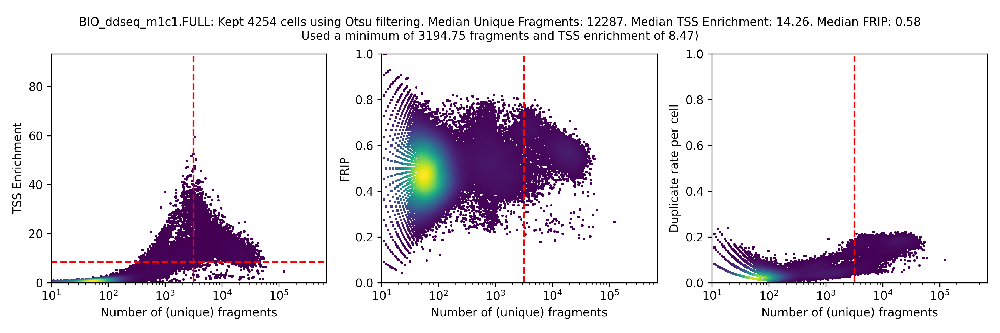

BIO_ddseq_m1c2.FULL bc passing filters exists, printing img and skipping


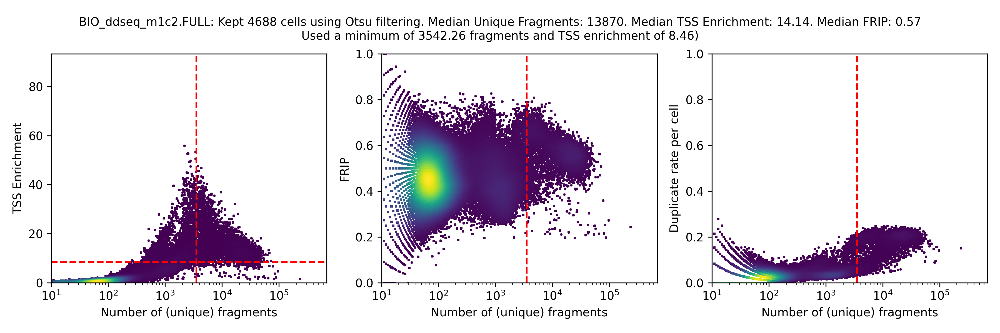

BIO_ddseq_m1c3.FULL bc passing filters exists, printing img and skipping


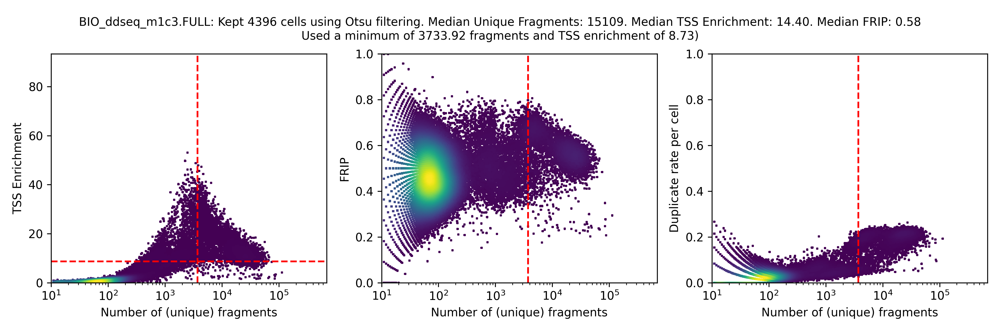

BIO_ddseq_m1c4.FULL bc passing filters exists, printing img and skipping


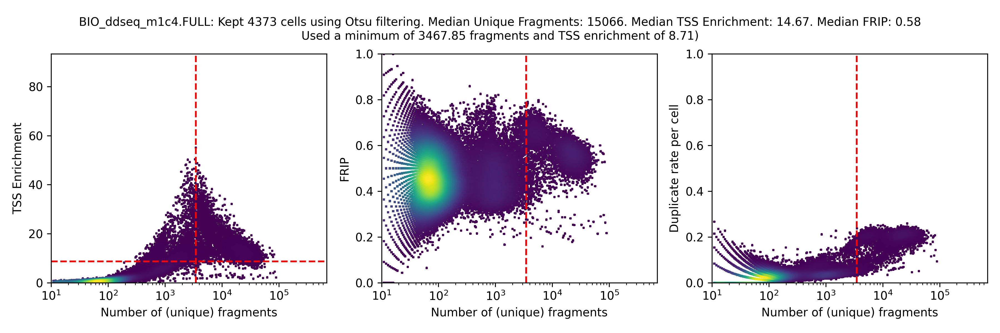

BIO_ddseq_m1c5.FULL bc passing filters exists, printing img and skipping


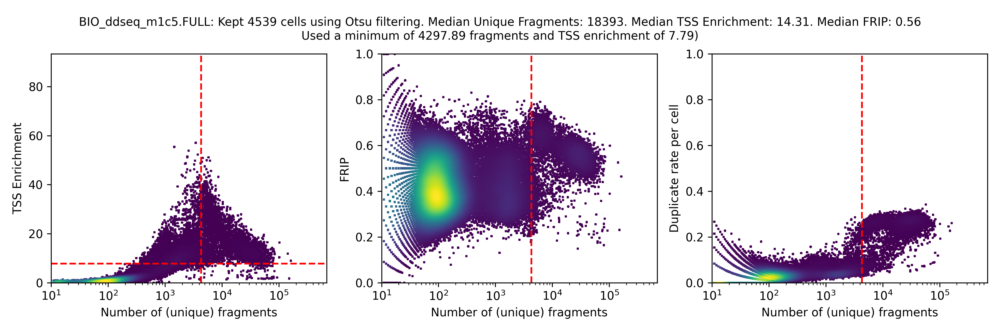

BIO_ddseq_m1c6.FULL bc passing filters exists, printing img and skipping


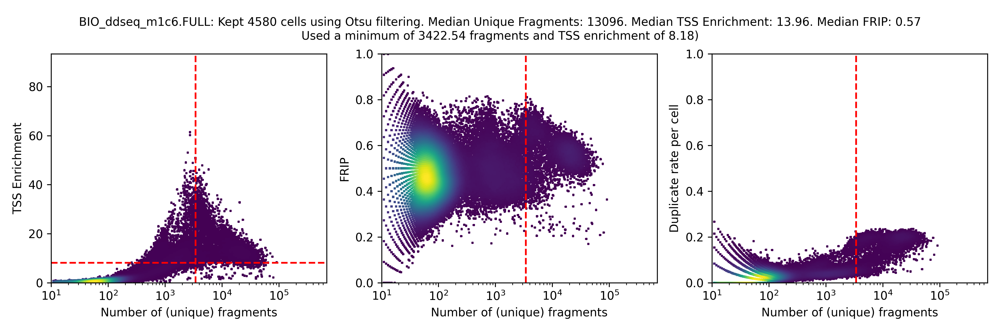

BIO_ddseq_m1c7.FULL bc passing filters exists, printing img and skipping


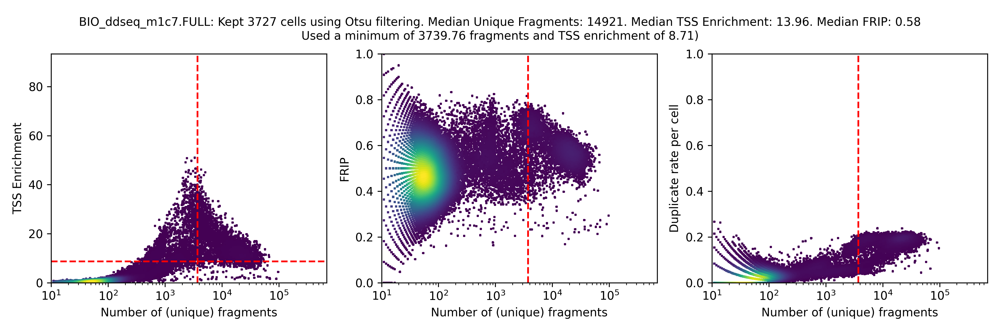

BIO_ddseq_m1c8.FULL bc passing filters exists, printing img and skipping


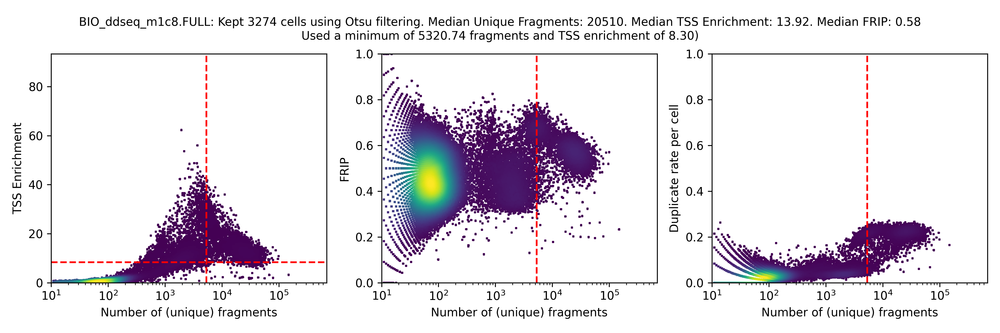

BIO_ddseq_m2c1.FULL bc passing filters exists, printing img and skipping


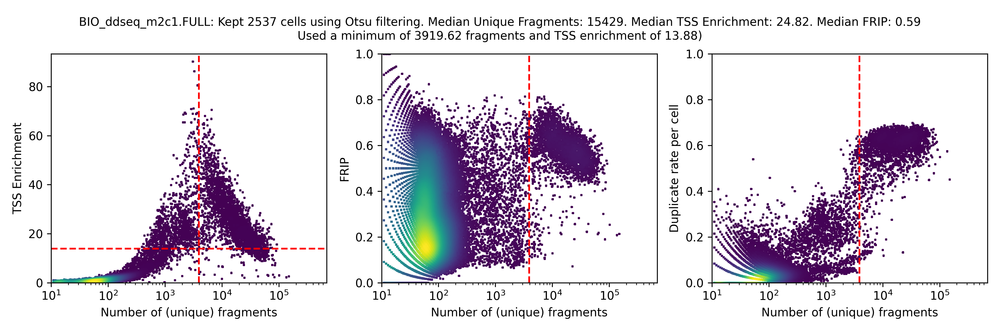

BIO_ddseq_m2c2.FULL bc passing filters exists, printing img and skipping


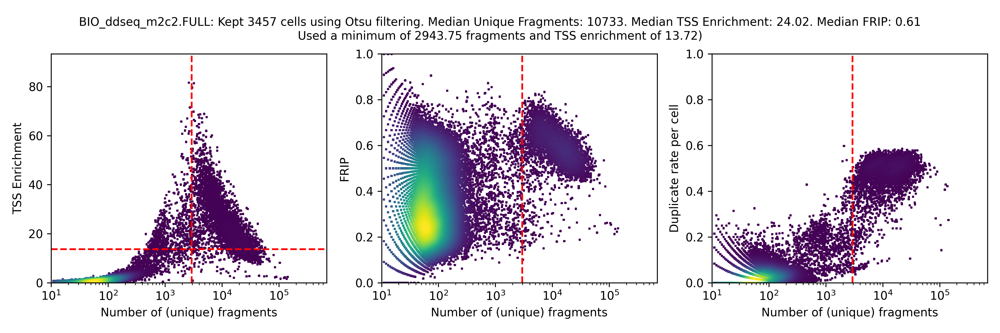

BIO_ddseq_m2c3.FULL bc passing filters exists, printing img and skipping


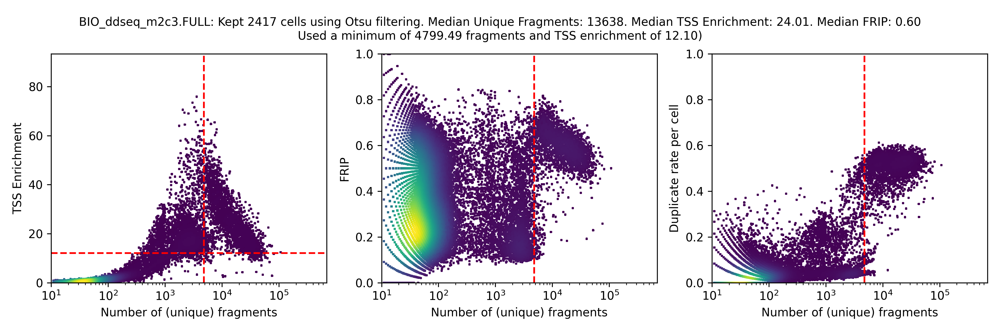

BIO_ddseq_m2c4.FULL bc passing filters exists, printing img and skipping


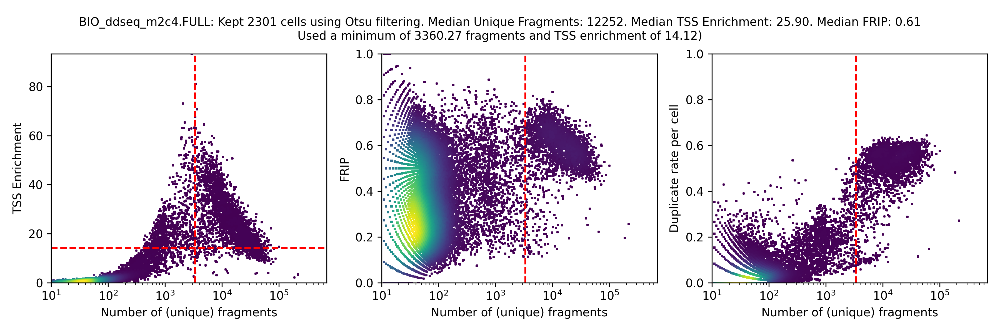

OHS_s3atac_mouse.FULL bc passing filters exists, printing img and skipping


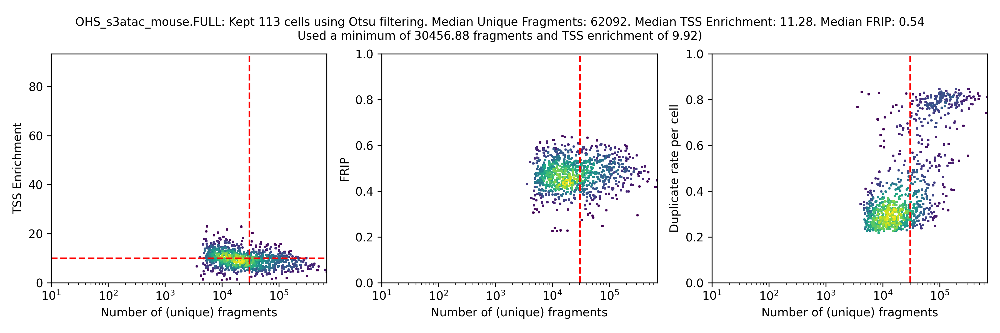

TXG_10xmultiome_e18mousebrainfresh.FULL bc passing filters exists, printing img and skipping


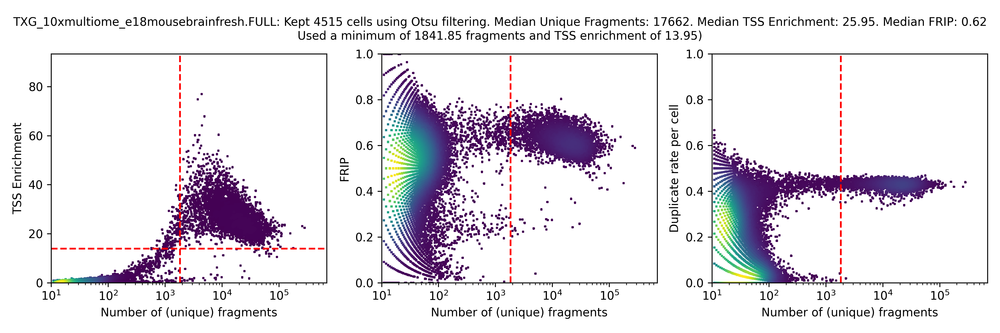

TXG_10xv11_adultmousecortexchromiumx.FULL bc passing filters exists, printing img and skipping


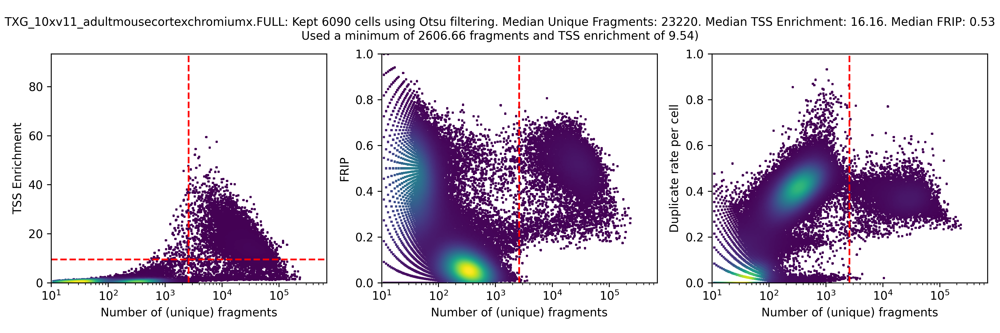

TXG_10xv1_adultmousefresh.FULL bc passing filters exists, printing img and skipping


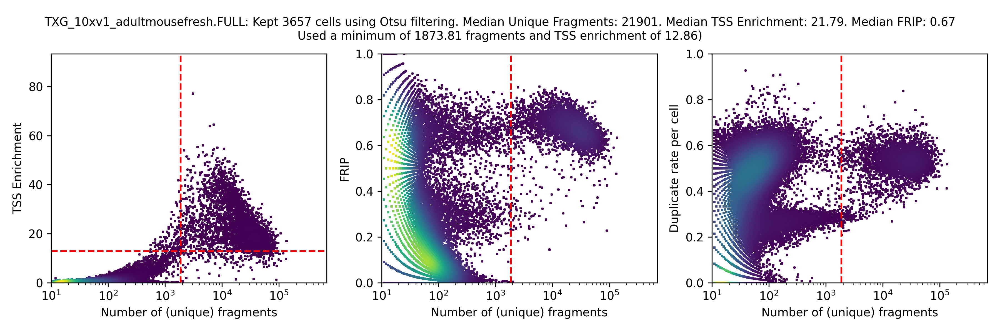

TXG_10xv2_adultmousecortex.FULL bc passing filters exists, printing img and skipping


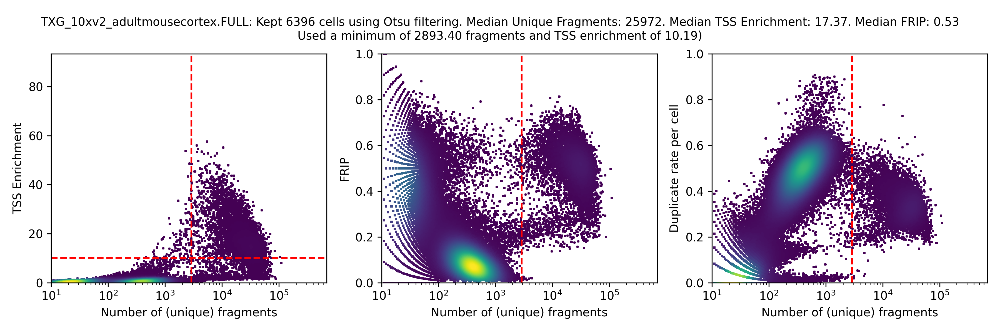

TXG_10xv2_adultmousecortexchromiumx.FULL bc passing filters exists, printing img and skipping


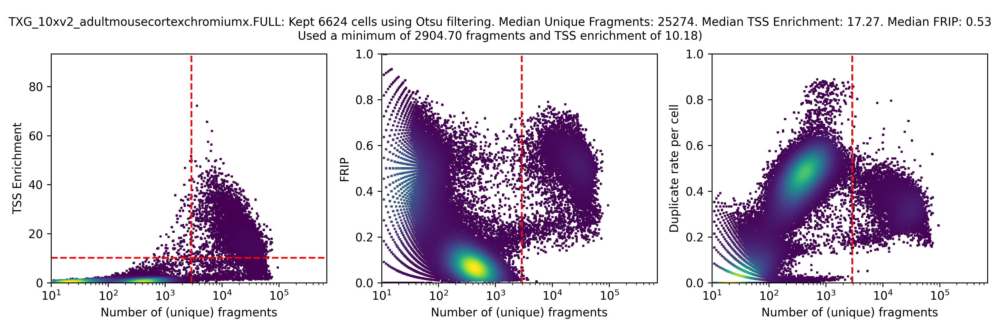

VIB_hydrop_1.FULL bc passing filters exists, printing img and skipping


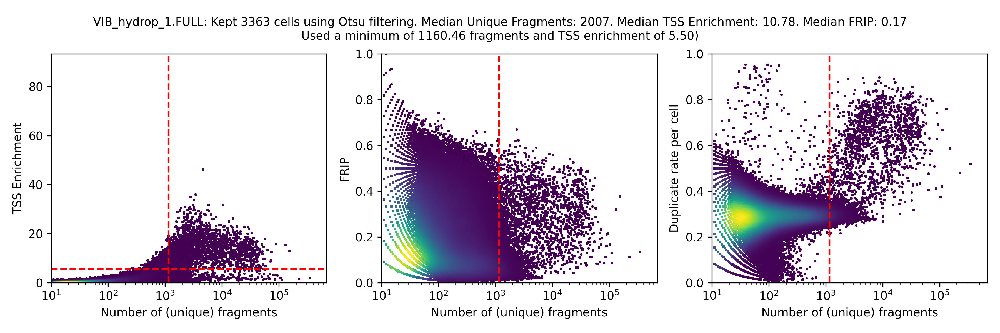

VIB_hydrop_2.FULL bc passing filters exists, printing img and skipping


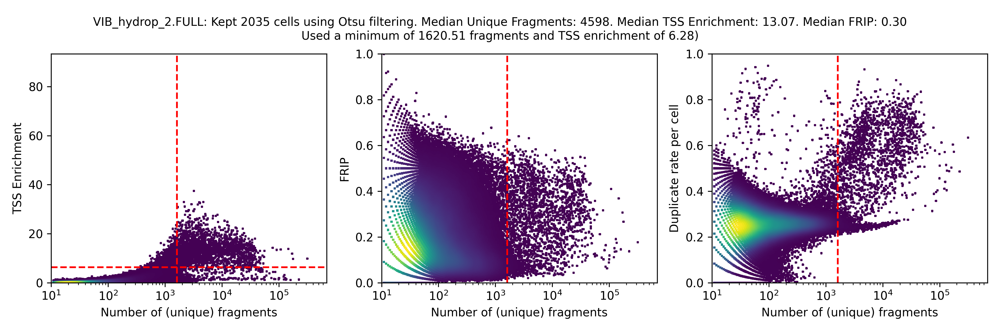

VIB_hydrop_3.FULL bc passing filters exists, printing img and skipping


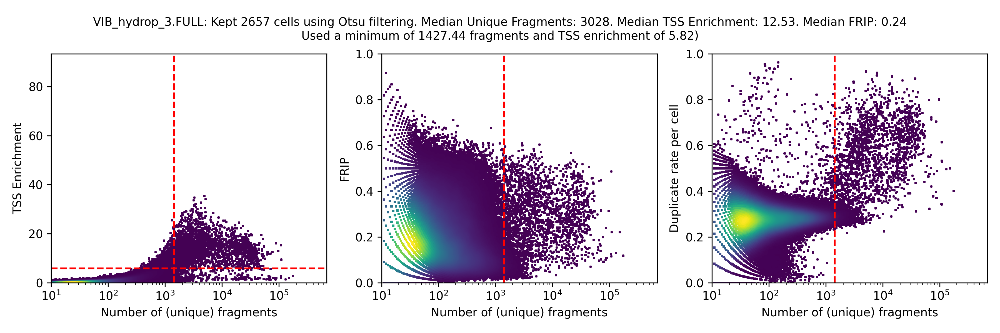

VIB_hydrop_4.FULL bc passing filters exists, printing img and skipping


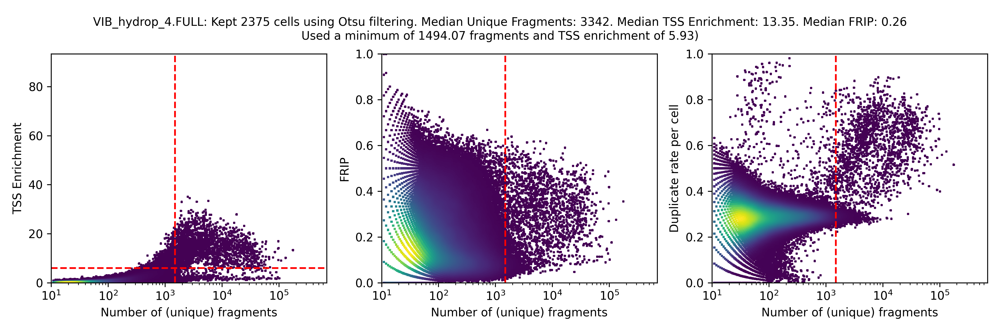

VIB_hydrop_5.FULL bc passing filters does not exist yet, generate using qc_plots.py script!


In [82]:
metadata_bc_pkl_list = sorted(glob.glob("cistopic_qc_out/*metadata_bc.pkl"))
metadata_bc_pkl_path_dict = {}
for metadata_bc_pkl_path in metadata_bc_pkl_list:
    sample = metadata_bc_pkl_path.split("/")[-1].split("__")[0]
    metadata_bc_pkl_path_dict[sample] = metadata_bc_pkl_path

for sample in metadata_bc_pkl_path_dict.keys():
    if os.path.exists(f"selected_barcodes/{sample}_bc_passing_filters_otsu.pkl"):
        print(f"{sample} bc passing filters exists, printing img and skipping")
        display(Image(f"plots_qc/{sample}_qc_otsu.png"))
    else:
        print(
            f"{sample} bc passing filters does not exist yet, generate using qc_plots.py script!"
        )

The biorad plots look a bit weird. I want to check significant overlap in barcodes between the biorad samples to check if something may have gone wrong when I merged the fastqs per sample.

In [11]:
import pandas as pd
import glob

In [12]:
df_merged = pd.DataFrame()
for file in glob.glob("selected_barcodes/BIO*.tsv"):
    df = pd.read_csv(file, sep="\t", index_col=0)
    df["raw_bc"] = [x.split("___")[0] for x in df.index]
    df["sample"] = [x.split("___")[1].replace("fragments.tsv.gz", "") for x in df.index]
    df_merged = pd.concat([df_merged, df])

In [13]:
df_merged

,Log_total_nr_frag,Log_unique_nr_frag,Total_nr_frag,Unique_nr_frag,Dupl_nr_frag,Dupl_rate,Total_nr_frag_in_regions,Unique_nr_frag_in_regions,FRIP,TSS_enrichment,sample_id,raw_bc,sample
ATTATTCTCCTGGCTATGTGC_GGTTCACCCGCGATAGACCAT_GTGTCCAATGAGCTCGTAGCC___BIO_ddseq_m1c6.FULL.fragments.tsv.gz,4.482931,4.387550,30404,24409,5995,0.197178,17482,14103,0.577779,12.210383,BIO_ddseq_m1c6.FULL.fragments.tsv.gz,ATTATTCTCCTGGCTATGTGC_GGTTCACCCGCGATAGACCAT_GT...,BIO_ddseq_m1c6.FULL.
CCGGTTTGCACAGCCGCGGCG___BIO_ddseq_m1c6.FULL.fragments.tsv.gz,3.642761,3.624695,4393,4214,179,0.040747,2026,1944,0.461319,11.468837,BIO_ddseq_m1c6.FULL.fragments.tsv.gz,CCGGTTTGCACAGCCGCGGCG,BIO_ddseq_m1c6.FULL.
AGGATACGACAATACTTGCGA_CCGCGATGAGCTAATGACCGC_TGAATCCTAAGGTAGAGAGGT___BIO_ddseq_m1c6.FULL.fragments.tsv.gz,4.409443,4.319897,25671,20888,4783,0.186319,14198,11608,0.555726,14.487470,BIO_ddseq_m1c6.FULL.fragments.tsv.gz,AGGATACGACAATACTTGCGA_CCGCGATGAGCTAATGACCGC_TG...,BIO_ddseq_m1c6.FULL.
ACACGCGCGCGCTTGGCAGGC_GAGGACAGCGTAGACAGGCGG___BIO_ddseq_m1c6.FULL.fragments.tsv.gz,4.354685,4.265596,22630,18433,4197,0.185462,14521,11804,0.640373,16.205300,BIO_ddseq_m1c6.FULL.fragments.tsv.gz,ACACGCGCGCGCTTGGCAGGC_GAGGACAGCGTAGACAGGCGG,BIO_ddseq_m1c6.FULL.
AGTAAGCATGAATACGCGGCG_CACTTCTGCTAATTATGGTGT_CCATAATGCTAATTAAGTTAT___BIO_ddseq_m1c6.FULL.fragments.tsv.gz,4.487365,4.383959,30716,24208,6508,0.211877,16492,13154,0.543374,11.226098,BIO_ddseq_m1c6.FULL.fragments.tsv.gz,AGTAAGCATGAATACGCGGCG_CACTTCTGCTAATTATGGTGT_CC...,BIO_ddseq_m1c6.FULL.
...,...,...,...,...,...,...,...,...,...,...,...,...,...
AATGATTCATACGCTTACAGA___BIO_ddseq_m2c3.FULL.fragments.tsv.gz,3.767230,3.743902,5851,5545,306,0.052299,3285,3122,0.563030,18.609391,BIO_ddseq_m2c3.FULL.fragments.tsv.gz,AATGATTCATACGCTTACAGA,BIO_ddseq_m2c3.FULL.
CTCATTTGGACGACAATGGCC___BIO_ddseq_m2c3.FULL.fragments.tsv.gz,3.879956,3.858838,7585,7225,360,0.047462,1622,1560,0.215917,15.231620,BIO_ddseq_m2c3.FULL.fragments.tsv.gz,CTCATTTGGACGACAATGGCC,BIO_ddseq_m2c3.FULL.
CTTGTCCTGTAGTGTTTCCTA___BIO_ddseq_m2c3.FULL.fragments.tsv.gz,4.343428,4.085148,22051,12166,9885,0.448279,13573,7590,0.623870,39.428398,BIO_ddseq_m2c3.FULL.fragments.tsv.gz,CTTGTCCTGTAGTGTTTCCTA,BIO_ddseq_m2c3.FULL.
ATTATTCTAACGCCCCTATGT___BIO_ddseq_m2c3.FULL.fragments.tsv.gz,3.718585,3.696182,5231,4968,263,0.050277,1870,1775,0.357287,19.533604,BIO_ddseq_m2c3.FULL.fragments.tsv.gz,ATTATTCTAACGCCCCTATGT,BIO_ddseq_m2c3.FULL.


In [14]:
test = df_merged.groupby("sample")["raw_bc"].value_counts()

In [15]:
test_df = test.unstack().T

In [16]:
test_df.sum(axis=1).sort_values(ascending=False)

raw_bc
TCGACAGCATCAGTCAGAGAG                                                                                            2.0
AATGATTGGTGTTTCCATAAT                                                                                            2.0
ATGAGCTCGCGCTTCAGAATT                                                                                            2.0
AACCACACGAGGTCACAGCTT                                                                                            2.0
CCTTAGGTAAGAGGTAGTGTT                                                                                            2.0
                                                                                                                ... 
AGCGAATATGAATATGACCGC_TACGCATCTCTTGCAACCACA                                                                      1.0
AGCGAATATGAATATTATCAT_CAGAATTATAGTTGAGGACGT_CGTAGCCGTGCATTGAGCGTG_GAGCTAAAATTGGTGCCTCGT_TTACAGATAACGCCCCTCCTT    1.0
AGCGAATATGAATATTATCAT_CAGAATTATAGTTGAGGACGT_GAGCTAAAATTGG

In [21]:
test_df

sample,BIO_ddseq_m1c1.FULL.,BIO_ddseq_m1c2.FULL.,BIO_ddseq_m1c3.FULL.,BIO_ddseq_m1c4.FULL.,BIO_ddseq_m1c5.FULL.,BIO_ddseq_m1c6.FULL.,BIO_ddseq_m1c7.FULL.,BIO_ddseq_m1c8.FULL.,BIO_ddseq_m2c1.FULL.,BIO_ddseq_m2c2.FULL.,BIO_ddseq_m2c3.FULL.,BIO_ddseq_m2c4.FULL.
raw_bc,,,,,,,,,,,,
AACCACAAACCACAACCATGC_TATACTTTCTTGTACATGTAT_TCGGATGGAGCGTGCTAACTC,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AACCACAAACCACAACTACGA_TCCGCTCGGCGTCCGATCACC_TGTTTAGCGGCCAGATAGTTG,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AACCACAAACCACACATGTAT_GTGGCGCTTCTGCAGATCACC,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
AACCACAAACCACATGGCCTT_GAGAGGTCGATGCAAATTCCA_GTTGATGCGCGCTTGAGAGGT_TGCGAGCCTATTCGGAATCAA_TGCTACTTGTCGCTTAGTGTT,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AACCACAAACGGTGAGCAACG_CATGTATCTATTCGTCGGCGT_TTGTAAGAAGTTATCGTACAA,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTCTCCTTAACGAGTGG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
TTTGGTCTCGGATGTTACAGA,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TTTGGTCTCGTTCTCACGGAC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [58]:
for file in glob.glob("selected_barcodes/BIO*.tsv"):
    print(file)

selected_barcodes/BIO_ddseq_m1c6.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m1c7.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m1c8.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m1c1.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m2c4.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m2c1.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m1c2.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m1c5.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m1c4.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m1c3.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m2c2.FULL_metadata_bc_df.tsv
selected_barcodes/BIO_ddseq_m2c3.FULL_metadata_bc_df.tsv


In [22]:
from upsetplot import generate_counts

In [ ]:
import pandas as pd
from upsetplot import plot
set_names = ['set1', 'set2', 'set3']
all_elems = set1.union(set2).union(set3)
df = pd.DataFrame([[e in set1, e in set2, e in set3] for e in all_elems], columns = set_names)
df_up = df.groupby(set_names).size()
plot(df_up, orientation='horizontal')

In [ ]:
all_elems = list(set().union(*sets))
df = pd.DataFrame([[e in st for st in sets] for e in all_elems], columns = set_names)

In [25]:
import numpy as np

In [26]:
df_merged = pd.DataFrame()
bc_set_dict = {}
for file in sorted(glob.glob("selected_barcodes/BIO*.tsv")):
    sample = file.split("/")[-1].split(".")[0]
    df = pd.read_csv(file, sep="\t", index_col=0)
    df["raw_bc"] = [x.split("___")[0] for x in df.index]
    bc_set = set(np.concatenate([x.split("_") for x in df["raw_bc"]]).ravel())

    bc_set_dict[sample] = bc_set

In [33]:
print(sorted(bc_set_dict.keys()))
set_list = [bc_set_dict[x] for x in sorted(bc_set_dict.keys())]

['BIO_ddseq_m1c1', 'BIO_ddseq_m1c2', 'BIO_ddseq_m1c3', 'BIO_ddseq_m1c4', 'BIO_ddseq_m1c5', 'BIO_ddseq_m1c6', 'BIO_ddseq_m1c7', 'BIO_ddseq_m1c8', 'BIO_ddseq_m2c1', 'BIO_ddseq_m2c2', 'BIO_ddseq_m2c3', 'BIO_ddseq_m2c4']


In [36]:
all_elems = list(set().union(*set_list))
df = pd.DataFrame([[e in st for st in set_list] for e in all_elems], columns = sorted(bc_set_dict.keys()))

In [37]:
df

,BIO_ddseq_m1c1,BIO_ddseq_m1c2,BIO_ddseq_m1c3,BIO_ddseq_m1c4,BIO_ddseq_m1c5,BIO_ddseq_m1c6,BIO_ddseq_m1c7,BIO_ddseq_m1c8,BIO_ddseq_m2c1,BIO_ddseq_m2c2,BIO_ddseq_m2c3,BIO_ddseq_m2c4
0,False,False,False,False,True,False,False,False,False,False,False,False
1,False,False,False,False,False,False,True,False,False,False,False,False
2,True,False,False,False,False,False,False,False,False,False,False,False
3,False,False,True,False,False,False,False,False,False,False,False,False
4,False,True,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
103036,False,False,False,False,False,True,False,False,False,False,False,False
103037,False,False,False,False,True,False,False,False,False,False,False,False
103038,True,False,False,False,False,False,False,False,False,False,False,False
103039,True,False,False,False,False,False,False,False,False,False,False,False


{'matrix': <AxesSubplot:>,
 'shading': <AxesSubplot:>,
 'totals': <AxesSubplot:>,
 'intersections': <AxesSubplot:ylabel='Intersection size'>}

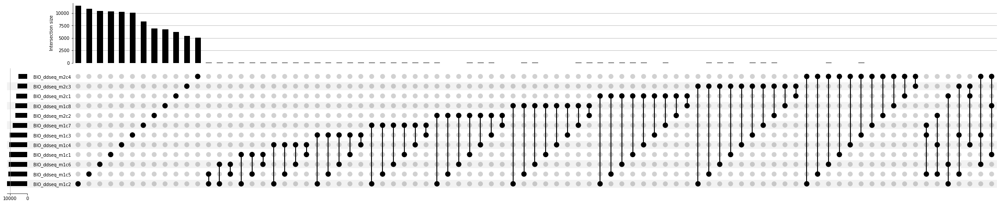

In [44]:
from upsetplot import plot
df_up = df.groupby(list(bc_set_dict.keys())).size()
plot(df_up, orientation='horizontal')

Ok, so nothing suspicious.

# override s3-atac

In [5]:
import pickle
import pandas as pd

with open("cistopic_qc_out/OHS_s3atac_mouse.FULL__metadata_bc.pkl", "rb") as f:
    df = pickle.load(f)

In [17]:
with open(
    "selected_barcodes/OHS_s3atac_mouse.FULL_bc_passing_filters_otsu.txt", "w"
) as f:
    for x in df.index:
        f.write(x + "\n")

In [11]:
with open(
    "selected_barcodes/OHS_s3atac_mouse.FULL_bc_passing_filters_otsu.pkl", "wb"
) as f:
    pickle.dump(df.index, f)